In [1]:
import torch
print("CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print(" Device:", torch.cuda.get_device_name(0))
    print(" CUDA version:", torch.version.cuda)


CUDA available: True
 Device: NVIDIA GeForce RTX 5070 Ti
 CUDA version: 12.1


C:\Users\rimic\anaconda3\envs\dl-tl\lib\site-packages\torch\cuda\__init__.py:235: UserWarning: 
NVIDIA GeForce RTX 5070 Ti with CUDA capability sm_120 is not compatible with the current PyTorch installation.
The current PyTorch install supports CUDA capabilities sm_50 sm_60 sm_61 sm_70 sm_75 sm_80 sm_86 sm_90.
If you want to use the NVIDIA GeForce RTX 5070 Ti GPU with PyTorch, please check the instructions at https://pytorch.org/get-started/locally/

  warnings.warn(


In [1]:
import torch
print("CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print(" Device:", torch.cuda.get_device_name(0))
    print(" CUDA version:", torch.version.cuda)


CUDA available: True
 Device: NVIDIA GeForce RTX 5070 Ti
 CUDA version: 12.8


In [3]:
import os, glob
import pandas as pd

# point this to your GroundTruth folder
gt_dir = r"C:\Users\rimic\Desktop\Skin Lesion Images for Melanoma Classification\archive\ISIC_2019_Training_GroundTruth"

# 1. See what files are actually in there:
print("Files in GroundTruth folder:", os.listdir(gt_dir))

# 2. Grab the CSV or XLS/XLSX automatically:
candidates = glob.glob(os.path.join(gt_dir, "*"))
gt_path = next(f for f in candidates if f.lower().endswith((".csv", ".xls", ".xlsx")))
print("Loading ground truth from:", gt_path)

# 3. Read with the right reader:
if gt_path.lower().endswith(".csv"):
    gt_df = pd.read_csv(gt_path)
else:
    gt_df = pd.read_excel(gt_path)

print(gt_df.head())


FileNotFoundError: [WinError 3] The system cannot find the path specified: 'C:\\Users\\rimic\\Desktop\\Skin Lesion Images for Melanoma Classification\\archive\\ISIC_2019_Training_GroundTruth'

In [4]:
import os

# Update this to your main 'archive' folder
archive_dir = r"C:\Users\rimic\Desktop\Skin Lesion Images for Melanoma Classification\archive"

# 1. List top-level contents in 'archive'
print("Contents of archive folder:")
for entry in os.listdir(archive_dir):
    print(" ", entry)

# 2. Look for the ground truth file/folder
gt_entries = [e for e in os.listdir(archive_dir) if "GroundTruth" in e]
print("\nGroundTruth-related entries found:")
for e in gt_entries:
    print(" ", e)


Contents of archive folder:
  ISIC_2019_Training_GroundTruth.csv
  ISIC_2019_Training_Input
  ISIC_2019_Training_Metadata.csv

GroundTruth-related entries found:
  ISIC_2019_Training_GroundTruth.csv


In [1]:
# Step 1: Imports
import os
import pandas as pd
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.model_selection import train_test_split

# Step 2: Define all the paths
archive_dir = r"C:\Users\rimic\Desktop\Skin Lesion Images for Melanoma Classification\archive"
img_dir     = os.path.join(archive_dir, "ISIC_2019_Training_Input")
gt_path     = os.path.join(archive_dir, "ISIC_2019_Training_GroundTruth.csv")
meta_path   = os.path.join(archive_dir, "ISIC_2019_Training_Metadata.csv")

# Step 3: Load the CSVs
gt_df   = pd.read_csv(gt_path)
meta_df = pd.read_csv(meta_path)

# Optional: inspect column names
print("GT columns:   ", gt_df.columns.tolist())
print("Meta columns: ", meta_df.columns.tolist())

# Step 4: Merge into a single DataFrame on the 'image' column
df = pd.merge(gt_df, meta_df, on="image")

# Step 5: Build absolute image paths & labels
df["img_path"] = df["image"].apply(lambda x: os.path.join(img_dir, f"{x}.jpg"))
df["label"]    = df["MEL"]   # use 'MEL' column for the melanoma indicator

# Step 6: Stratified train/validation split
train_df, val_df = train_test_split(
    df,
    test_size=0.2,
    stratify=df["label"],
    random_state=42
)

# Step 7: Define a custom Dataset
class ISICDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(row["img_path"]).convert("RGB")
        if self.transform:
            img = self.transform(img)
        label = int(row["label"])
        return img, label

# Step 8: Define data transforms
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ToTensor(),
])
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Step 9: Create DataLoader objects
train_ds     = ISICDataset(train_df, transform=train_transform)
val_ds       = ISICDataset(val_df,   transform=val_transform)
train_loader = DataLoader(train_ds, batch_size=32, shuffle=True,  num_workers=0)
val_loader   = DataLoader(val_ds,   batch_size=32, shuffle=False, num_workers=0)

# Step 10: Quick sanity check
imgs, lbls = next(iter(train_loader))
print("Batch image tensor shape:", imgs.shape)
print("Batch label tensor shape:", lbls.shape)


GT columns:    ['image', 'MEL', 'NV', 'BCC', 'AK', 'BKL', 'DF', 'VASC', 'SCC', 'UNK']
Meta columns:  ['image', 'age_approx', 'anatom_site_general', 'lesion_id', 'sex']


FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\rimic\\Desktop\\Skin Lesion Images for Melanoma Classification\\archive\\ISIC_2019_Training_Input\\ISIC_0073080.jpg'

In [2]:
# Step 1: Imports
import os
import pandas as pd
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.model_selection import train_test_split

# Step 2: Define all the paths (corrected image directory)
archive_dir = r"C:\Users\rimic\Desktop\Skin Lesion Images for Melanoma Classification\archive"
img_dir     = os.path.join(archive_dir, "ISIC_2019_Training_Input", "ISIC_2019_Training_Input")
gt_path     = os.path.join(archive_dir, "ISIC_2019_Training_GroundTruth.csv")
meta_path   = os.path.join(archive_dir, "ISIC_2019_Training_Metadata.csv")

# Step 3: Load the CSVs
gt_df   = pd.read_csv(gt_path)
meta_df = pd.read_csv(meta_path)

# Optional: inspect column names
print("GT columns:   ", gt_df.columns.tolist())
print("Meta columns: ", meta_df.columns.tolist())

# Step 4: Merge into a single DataFrame on the 'image' column
df = pd.merge(gt_df, meta_df, on="image")

# Step 5: Build absolute image paths & labels
df["img_path"] = df["image"].apply(lambda x: os.path.join(img_dir, f"{x}.jpg"))
df["label"]    = df["MEL"]   # use 'MEL' column for the melanoma indicator

# Quick check: confirm a few image paths exist
for p in df["img_path"].sample(5):
    print(p, "exists?", os.path.exists(p))

# Step 6: Stratified train/validation split
train_df, val_df = train_test_split(
    df,
    test_size=0.2,
    stratify=df["label"],
    random_state=42
)

# Step 7: Define a custom Dataset
class ISICDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(row["img_path"]).convert("RGB")
        if self.transform:
            img = self.transform(img)
        label = int(row["label"])
        return img, label

# Step 8: Define data transforms
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ToTensor(),
])
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Step 9: Create DataLoader objects
train_ds     = ISICDataset(train_df, transform=train_transform)
val_ds       = ISICDataset(val_df,   transform=val_transform)
train_loader = DataLoader(train_ds, batch_size=32, shuffle=True,  num_workers=0)
val_loader   = DataLoader(val_ds,   batch_size=32, shuffle=False, num_workers=0)

# Step 10: Quick sanity check
imgs, lbls = next(iter(train_loader))
print("Batch image tensor shape:", imgs.shape)
print("Batch label tensor shape:", lbls.shape)


GT columns:    ['image', 'MEL', 'NV', 'BCC', 'AK', 'BKL', 'DF', 'VASC', 'SCC', 'UNK']
Meta columns:  ['image', 'age_approx', 'anatom_site_general', 'lesion_id', 'sex']
C:\Users\rimic\Desktop\Skin Lesion Images for Melanoma Classification\archive\ISIC_2019_Training_Input\ISIC_2019_Training_Input\ISIC_0026674.jpg exists? True
C:\Users\rimic\Desktop\Skin Lesion Images for Melanoma Classification\archive\ISIC_2019_Training_Input\ISIC_2019_Training_Input\ISIC_0063836.jpg exists? True
C:\Users\rimic\Desktop\Skin Lesion Images for Melanoma Classification\archive\ISIC_2019_Training_Input\ISIC_2019_Training_Input\ISIC_0072115.jpg exists? True
C:\Users\rimic\Desktop\Skin Lesion Images for Melanoma Classification\archive\ISIC_2019_Training_Input\ISIC_2019_Training_Input\ISIC_0070175.jpg exists? True
C:\Users\rimic\Desktop\Skin Lesion Images for Melanoma Classification\archive\ISIC_2019_Training_Input\ISIC_2019_Training_Input\ISIC_0070931.jpg exists? True
Batch image tensor shape: torch.Size([32, 

In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models

# a) Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# b) Model (binary melanoma detection → single-output head)
model = models.resnet50(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, 1)    # replace final layer
model = model.to(device)

# c) Loss & optimizer
criterion = nn.BCEWithLogitsLoss()               # for single-sigmoid output
optimizer = optim.Adam(model.parameters(), lr=1e-4)


Using device: cuda


C:\Users\rimic\anaconda3\envs\dl-tl\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\rimic\anaconda3\envs\dl-tl\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [4]:
from tqdm import tqdm    # for a progress bar

def train_one_epoch(loader, model, criterion, optimizer, device):
    model.train()
    running_loss = 0.0

    for images, labels in tqdm(loader, desc="Train"):
        images = images.to(device)
        labels = labels.float().unsqueeze(1).to(device)   # shape [B,1]

        # forward + backward
        outputs = model(images)
        loss = criterion(outputs, labels)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

    epoch_loss = running_loss / len(loader.dataset)
    return epoch_loss


In [5]:
from sklearn.metrics import roc_auc_score

@torch.no_grad()
def validate(loader, model, criterion, device):
    model.eval()
    running_loss = 0.0
    all_labels, all_probs = [], []

    for images, labels in tqdm(loader, desc="Val"):
        images = images.to(device)
        labels = labels.float().unsqueeze(1).to(device)

        outputs = model(images)
        loss = criterion(outputs, labels)
        running_loss += loss.item() * images.size(0)

        probs = torch.sigmoid(outputs).cpu().numpy()
        all_probs.extend(probs.ravel())
        all_labels.extend(labels.cpu().numpy().ravel())

    epoch_loss = running_loss / len(loader.dataset)
    epoch_auc  = roc_auc_score(all_labels, all_probs)
    return epoch_loss, epoch_auc


In [6]:
num_epochs = 10
best_auc   = 0.0

for epoch in range(1, num_epochs+1):
    train_loss = train_one_epoch(train_loader, model, criterion, optimizer, device)
    val_loss, val_auc = validate(val_loader, model, criterion, device)

    print(f"Epoch {epoch:02d} — "
          f"Train Loss: {train_loss:.4f} | "
          f"Val Loss: {val_loss:.4f} | "
          f"Val AUC: {val_auc:.4f}")

    # checkpoint best model
    if val_auc > best_auc:
        best_auc = val_auc
        torch.save(model.state_dict(), "best_melanoma_resnet50.pth")
        print("  ↳ New best AUC, model saved.")


Val: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 159/159 [00:58<00:00,  2.73it/s]


Epoch 01 — Train Loss: 0.3511 | Val Loss: 0.2998 | Val AUC: 0.8871
  ↳ New best AUC, model saved.


Val: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 159/159 [00:39<00:00,  4.04it/s]


Epoch 02 — Train Loss: 0.3082 | Val Loss: 0.2802 | Val AUC: 0.9025
  ↳ New best AUC, model saved.


Val: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 159/159 [00:39<00:00,  4.06it/s]


Epoch 03 — Train Loss: 0.2839 | Val Loss: 0.3092 | Val AUC: 0.9028
  ↳ New best AUC, model saved.


Val: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 159/159 [00:38<00:00,  4.09it/s]


Epoch 04 — Train Loss: 0.2580 | Val Loss: 0.2686 | Val AUC: 0.9079
  ↳ New best AUC, model saved.


Val: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 159/159 [00:39<00:00,  4.07it/s]


Epoch 05 — Train Loss: 0.2376 | Val Loss: 0.2797 | Val AUC: 0.9078


Val: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 159/159 [00:38<00:00,  4.08it/s]


Epoch 06 — Train Loss: 0.2143 | Val Loss: 0.2821 | Val AUC: 0.9184
  ↳ New best AUC, model saved.


Val: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 159/159 [00:38<00:00,  4.08it/s]


Epoch 07 — Train Loss: 0.1931 | Val Loss: 0.2629 | Val AUC: 0.9127


Val: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 159/159 [00:38<00:00,  4.08it/s]


Epoch 08 — Train Loss: 0.1683 | Val Loss: 0.2667 | Val AUC: 0.9228
  ↳ New best AUC, model saved.


Val: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 159/159 [00:38<00:00,  4.08it/s]


Epoch 09 — Train Loss: 0.1521 | Val Loss: 0.2591 | Val AUC: 0.9305
  ↳ New best AUC, model saved.


Val: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 159/159 [00:38<00:00,  4.09it/s]

Epoch 10 — Train Loss: 0.1363 | Val Loss: 0.2722 | Val AUC: 0.9280


In [7]:
import torch
import torchvision.models as models
import torch.nn as nn

# 1. (Re)create your exact model architecture:
model = models.resnet50(pretrained=False)
model.fc = nn.Linear(model.fc.in_features, 1)

# 2. Load the weights you’ve been checkpointing:
model.load_state_dict(torch.load("best_melanoma_resnet50.pth", map_location="cpu"))

# 3a. Save just the state_dict (recommended):
torch.save(model.state_dict(), "melanoma_resnet50_state_dict.pth")

# 3b. (Optional) Save the entire model object:
torch.save(model, "melanoma_resnet50_full_model.pth")


C:\Users\rimic\anaconda3\envs\dl-tl\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\rimic\anaconda3\envs\dl-tl\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [2]:
import os
import pandas as pd
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
import torch.nn as nn
from sklearn.model_selection import train_test_split

# Paths
archive_dir = r"C:\Users\rimic\Desktop\Skin Lesion Images for Melanoma Classification\archive"
img_dir     = os.path.join(archive_dir, "ISIC_2019_Training_Input", "ISIC_2019_Training_Input")
gt_path     = os.path.join(archive_dir, "ISIC_2019_Training_GroundTruth.csv")
meta_path   = os.path.join(archive_dir, "ISIC_2019_Training_Metadata.csv")


In [3]:
gt_df   = pd.read_csv(gt_path)
meta_df = pd.read_csv(meta_path)
df      = pd.merge(gt_df, meta_df, on="image")
df["img_path"] = df["image"].apply(lambda x: os.path.join(img_dir, f"{x}.jpg"))
df["label"]    = df["MEL"]

train_df, val_df = train_test_split(df, test_size=0.2, stratify=df["label"], random_state=42)

class ISICDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform
    def __len__(self):
        return len(self.df)
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(row["img_path"]).convert("RGB")
        if self.transform: img = self.transform(img)
        return img, int(row["label"])

train_transform = transforms.Compose([transforms.Resize((224,224)), transforms.ToTensor()])
val_transform   = transforms.Compose([transforms.Resize((224,224)), transforms.ToTensor()])

train_loader = DataLoader(ISICDataset(train_df, train_transform), batch_size=32, shuffle=True,  num_workers=0)
val_loader   = DataLoader(ISICDataset(val_df,   val_transform), batch_size=32, shuffle=False, num_workers=0)


In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.resnet50(pretrained=False)
model.fc = nn.Linear(model.fc.in_features, 1)
model.load_state_dict(torch.load("best_melanoma_resnet50.pth", map_location=device))
model = model.to(device)
model.eval()   # or .train() if you want to continue training


C:\Users\rimic\anaconda3\envs\dl-tl\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\rimic\anaconda3\envs\dl-tl\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [4]:
import torch
from sklearn.metrics import roc_auc_score, accuracy_score
from tqdm import tqdm

# 1. Put model in eval-mode
model.eval()

all_labels = []
all_probs  = []

# 2. Run through the val_loader
with torch.no_grad():
    for images, labels in tqdm(val_loader, desc="Evaluating"):
        images = images.to(device)
        labels = labels.to(device)

        logits = model(images)
        probs  = torch.sigmoid(logits).squeeze(1)

        all_labels.extend(labels.cpu().tolist())
        all_probs.extend(probs.cpu().tolist())

# 3. Compute metrics
auc = roc_auc_score(all_labels, all_probs)
# choose 0.5 threshold for accuracy (you can tune this)
preds = [1 if p>=0.5 else 0 for p in all_probs]
acc   = accuracy_score(all_labels, preds)

print(f"Validation AUC:      {auc:.4f}")
print(f"Validation Accuracy: {acc:.4f}")


Evaluating: 100%|████████████████████████████████████████████████████████████████████| 159/159 [00:55<00:00,  2.84it/s]

Validation AUC:      0.9305
Validation Accuracy: 0.9035


In [5]:
from sklearn.metrics import confusion_matrix, classification_report

# choose a handful of thresholds to inspect
for thr in [0.3, 0.5, 0.7]:
    preds = [1 if p >= thr else 0 for p in all_probs]
    cm    = confusion_matrix(all_labels, preds)
    print(f"\nThreshold = {thr}")
    print("Confusion matrix:\n", cm)
    print(classification_report(all_labels, preds, digits=4))



Threshold = 0.3
Confusion matrix:
 [[3843  319]
 [ 215  690]]
              precision    recall  f1-score   support

           0     0.9470    0.9234    0.9350      4162
           1     0.6838    0.7624    0.7210       905

    accuracy                         0.8946      5067
   macro avg     0.8154    0.8429    0.8280      5067
weighted avg     0.9000    0.8946    0.8968      5067


Threshold = 0.5
Confusion matrix:
 [[3959  203]
 [ 286  619]]
              precision    recall  f1-score   support

           0     0.9326    0.9512    0.9418      4162
           1     0.7530    0.6840    0.7169       905

    accuracy                         0.9035      5067
   macro avg     0.8428    0.8176    0.8293      5067
weighted avg     0.9006    0.9035    0.9017      5067


Threshold = 0.7
Confusion matrix:
 [[4052  110]
 [ 380  525]]
              precision    recall  f1-score   support

           0     0.9143    0.9736    0.9430      4162
           1     0.8268    0.5801    0.6818     

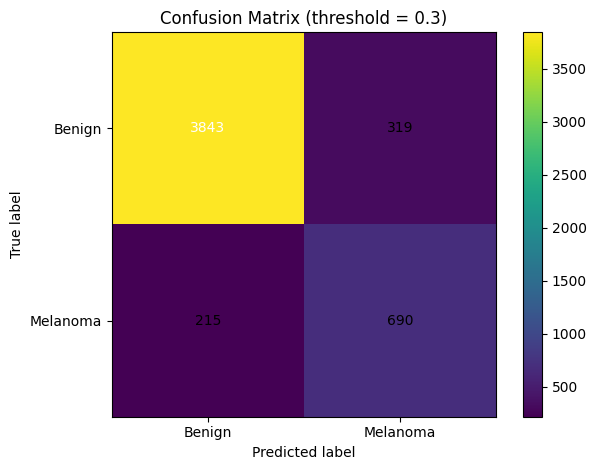

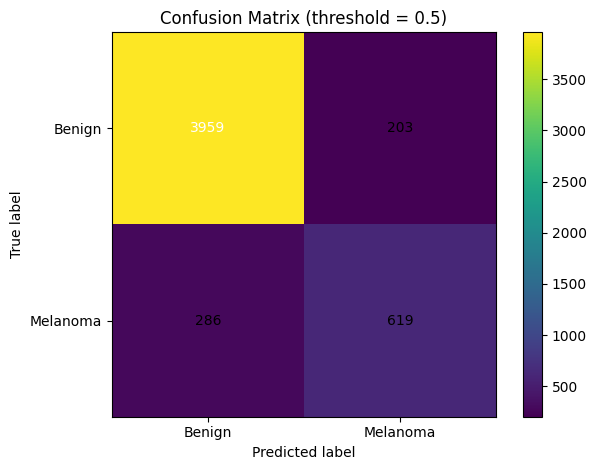

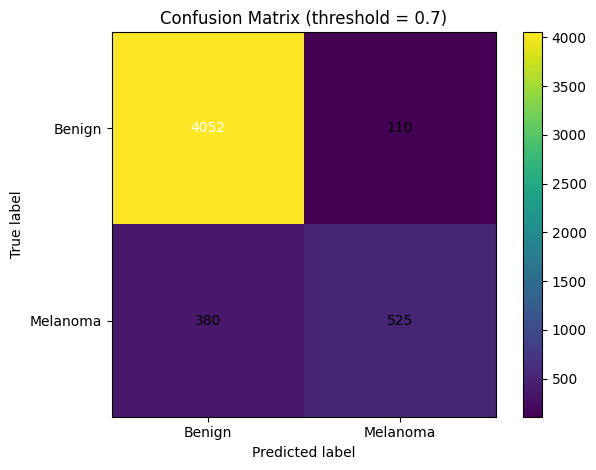

In [6]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# assume you’ve already got:
# all_labels = list of true 0/1 labels
# all_probs  = list of predicted probabilities

thresholds = [0.3, 0.5, 0.7]
for thr in thresholds:
    # binarize predictions at this threshold
    preds = [1 if p >= thr else 0 for p in all_probs]
    cm = confusion_matrix(all_labels, preds)

    plt.figure()
    plt.imshow(cm, interpolation='nearest')      # default viridis colormap
    plt.title(f"Confusion Matrix (threshold = {thr})")
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.xticks([0,1], ["Benign","Melanoma"])
    plt.yticks([0,1], ["Benign","Melanoma"])
    plt.colorbar()

    # annotate each cell with its count
    thresh = cm.max() / 2.0
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(j, i, f"{cm[i,j]}",
                     ha="center", va="center",
                     color="white" if cm[i,j] > thresh else "black")
    plt.tight_layout()
    plt.show()


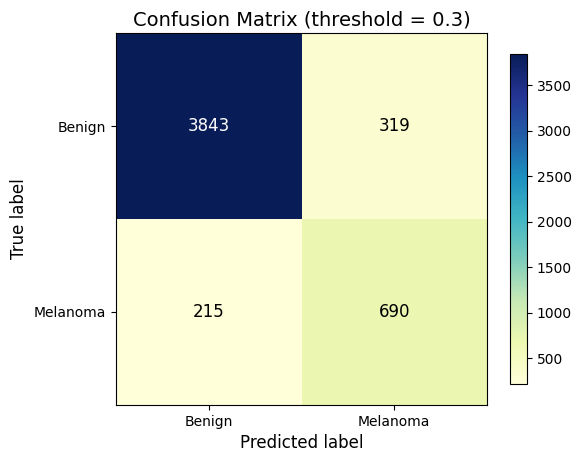

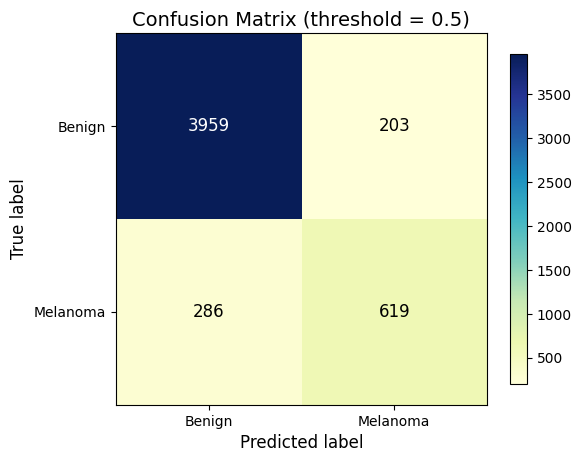

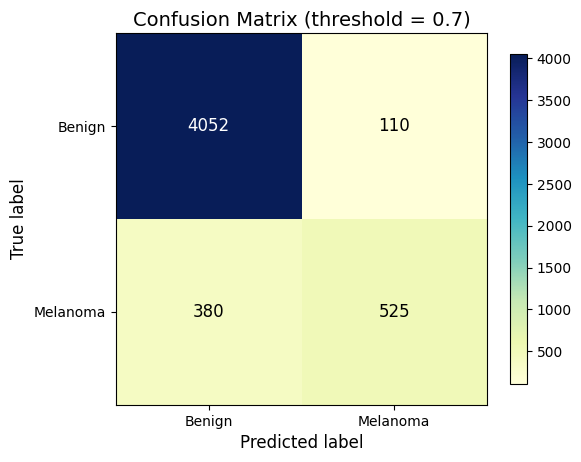

In [7]:
# 1. Recompute labels & probabilities (evaluation pass)
all_labels, all_probs = [], []
model.eval()
with torch.no_grad():
    for images, labels in val_loader:
        images = images.to(device)
        labels = labels.to(device)
        logits = model(images)
        probs = torch.sigmoid(logits).squeeze(1)
        all_probs.extend(probs.cpu().tolist())
        all_labels.extend(labels.cpu().tolist())

# 2. Plot aesthetic confusion matrices
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

cmap = plt.get_cmap("YlGnBu")
thresholds = [0.3, 0.5, 0.7]

for thr in thresholds:
    preds = [1 if p >= thr else 0 for p in all_probs]
    cm = confusion_matrix(all_labels, preds)

    plt.figure(figsize=(6, 5))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(f"Confusion Matrix (threshold = {thr})", fontsize=14)
    plt.xlabel("Predicted label", fontsize=12)
    plt.ylabel("True label", fontsize=12)
    plt.xticks([0,1], ["Benign","Melanoma"], fontsize=10)
    plt.yticks([0,1], ["Benign","Melanoma"], fontsize=10)
    plt.colorbar(shrink=0.8)

    thresh_val = cm.max() / 2.0
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(
                j, i, cm[i,j],
                ha="center", va="center",
                color="white" if cm[i,j] > thresh_val else "black",
                fontsize=12
            )
    plt.tight_layout()
    plt.show()


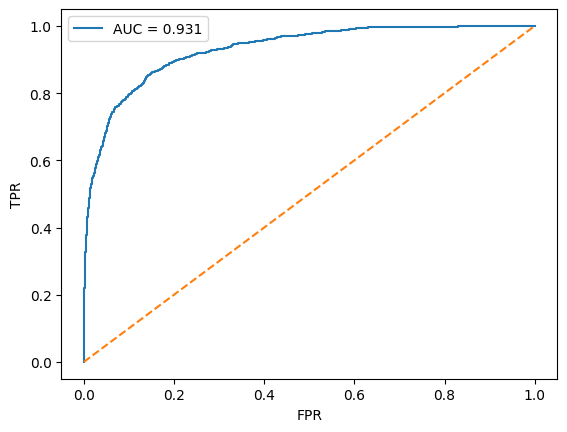

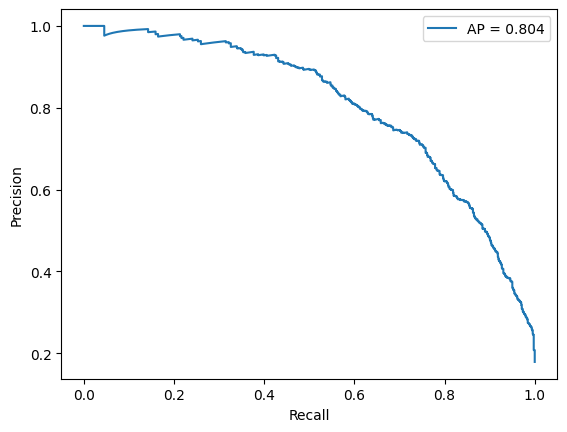

In [8]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, precision_recall_curve, auc

# ROC
fpr, tpr, _ = roc_curve(all_labels, all_probs)
roc_auc = auc(fpr, tpr)
plt.figure(); plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.3f}")
plt.plot([0,1],[0,1],"--"); plt.xlabel("FPR"); plt.ylabel("TPR"); plt.legend(); plt.show()

# PR
precision, recall, _ = precision_recall_curve(all_labels, all_probs)
pr_auc = auc(recall, precision)
plt.figure(); plt.plot(recall, precision, label=f"AP = {pr_auc:.3f}")
plt.xlabel("Recall"); plt.ylabel("Precision"); plt.legend(); plt.show()


In [9]:
from sklearn.calibration import CalibratedClassifierCV

# wrap your PyTorch model in a sklearn-like interface, or use validation set probs:
# here we’ll illustrate Platt-scaling on the val set:
from sklearn.isotonic import IsotonicRegression
iso_reg = IsotonicRegression(out_of_bounds="clip").fit(all_probs, all_labels)
calibrated = iso_reg.transform(all_probs)
# re-compute AUC
print("Calibrated AUC:", roc_auc_score(all_labels, calibrated))


Calibrated AUC: 0.9327916880165453


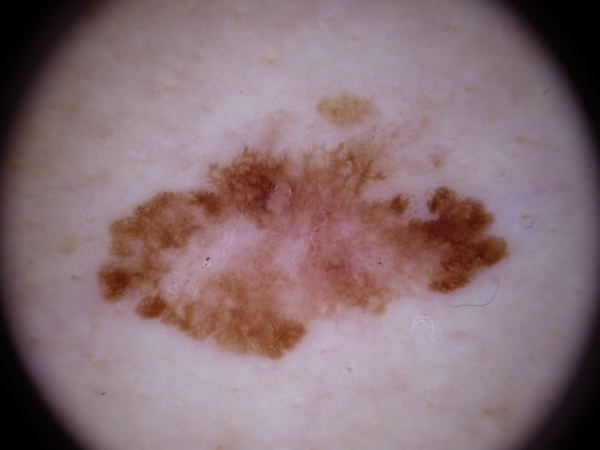

True: 0 Pred prob: 0.8985349535942078


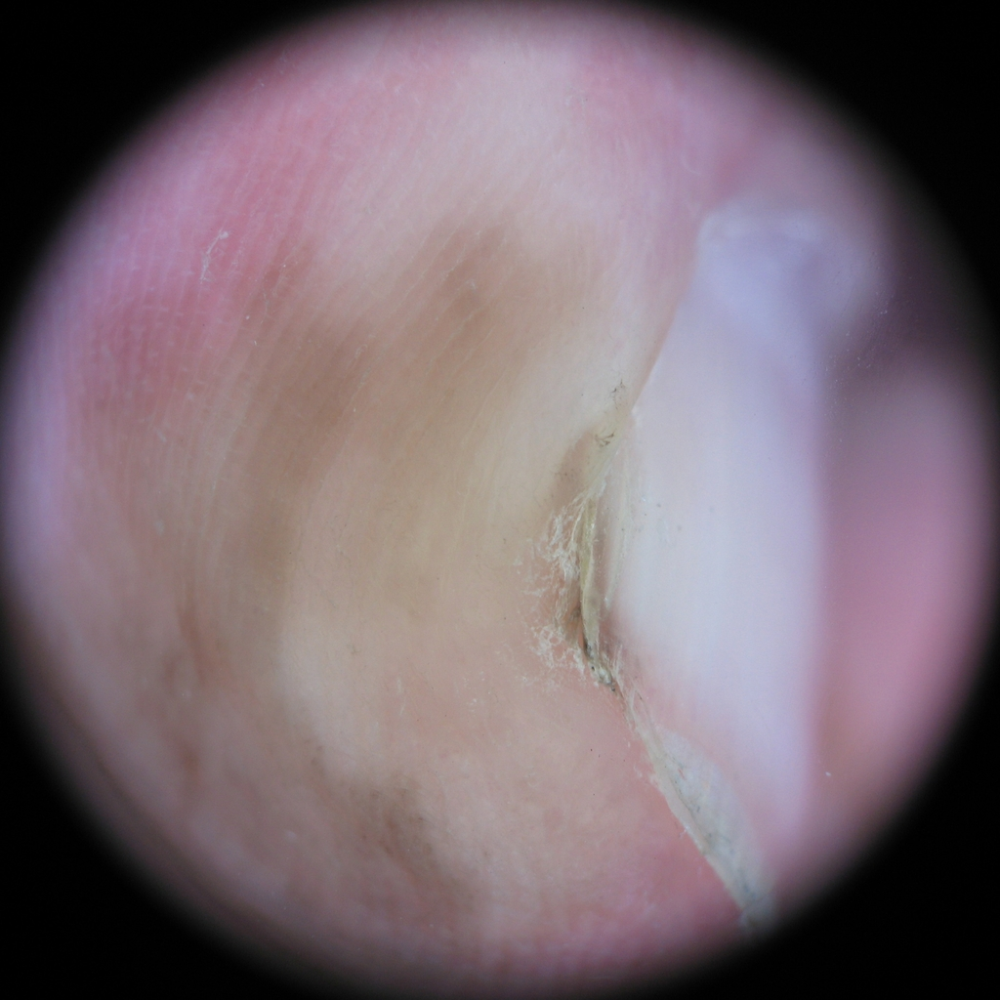

True: 0 Pred prob: 0.5860235691070557


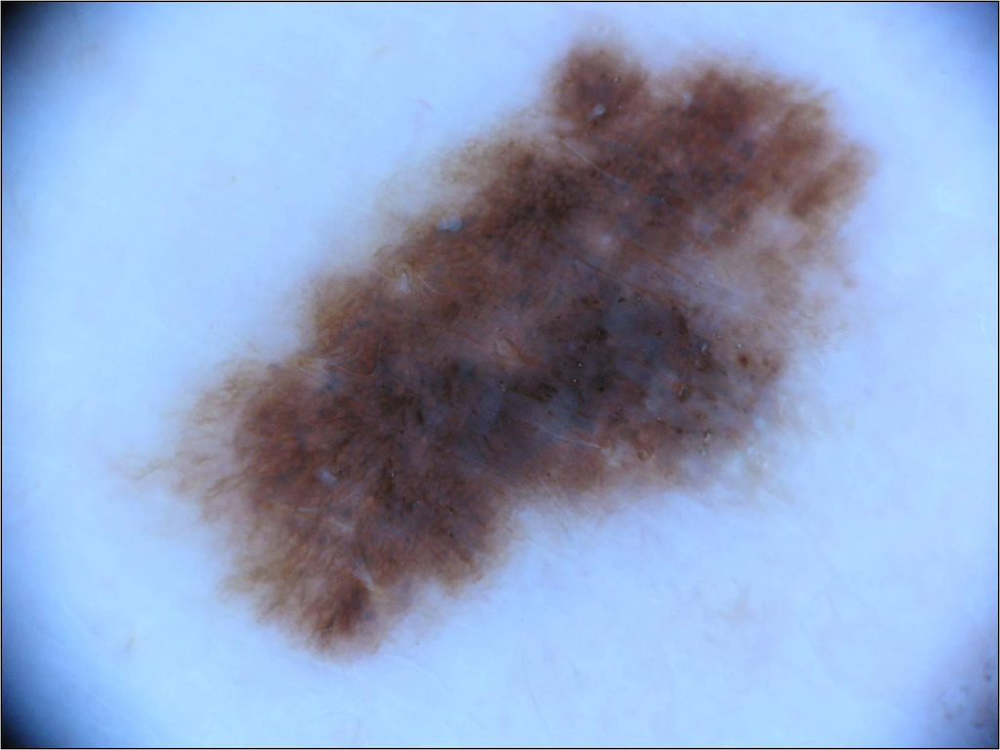

True: 0 Pred prob: 0.7228583693504333


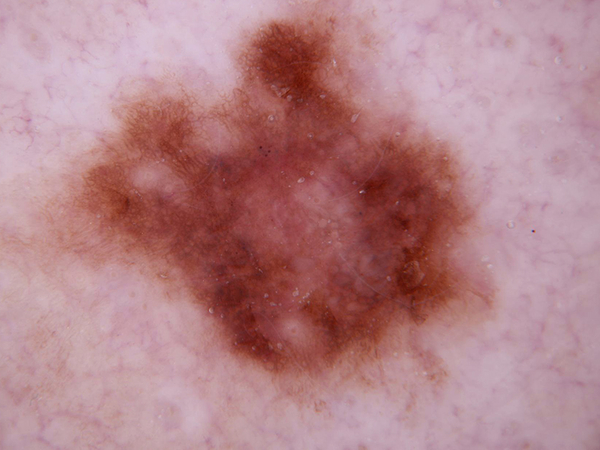

True: 1 Pred prob: 0.45738649368286133


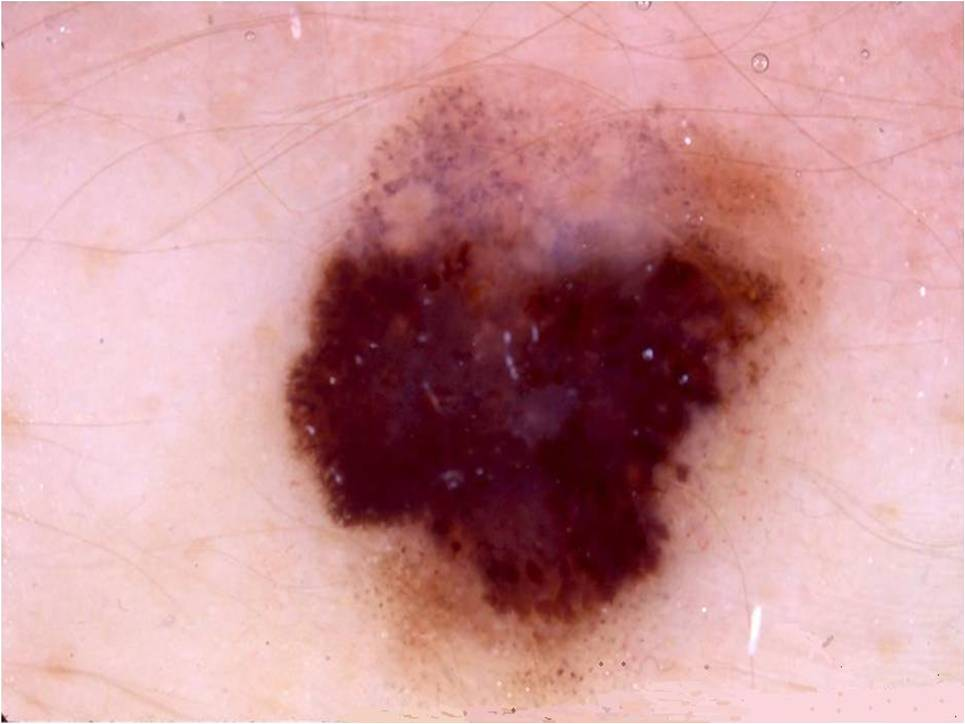

True: 1 Pred prob: 0.02944803237915039


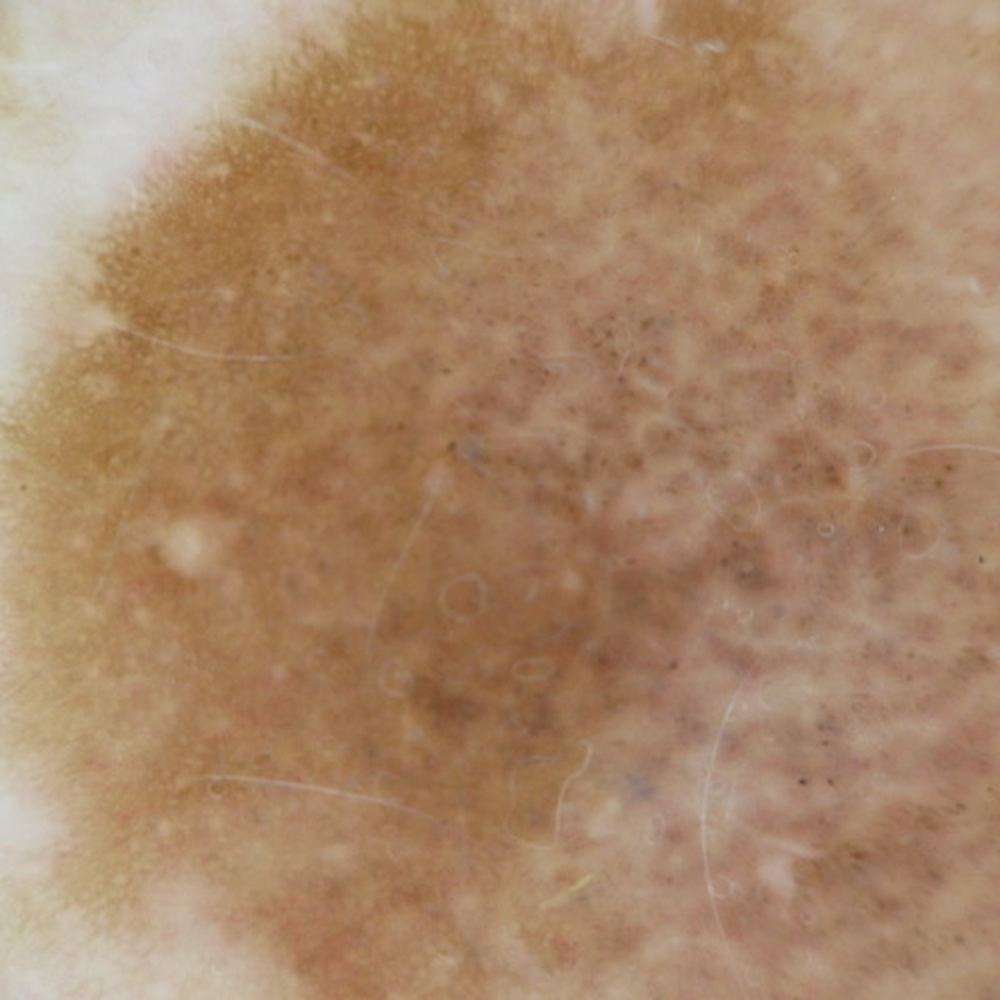

True: 1 Pred prob: 0.13189812004566193


In [10]:
import numpy as np
# collect indices of FPs and FNs
preds = np.array([1 if p>=0.5 else 0 for p in all_probs])
labels = np.array(all_labels)
fp_idx = np.where((preds==1)&(labels==0))[0]
fn_idx = np.where((preds==0)&(labels==1))[0]

# view a few failure cases
for idx in list(fp_idx[:3]) + list(fn_idx[:3]):
    img_path = val_df.iloc[idx]["img_path"]
    display(Image.open(img_path))  # notebook display
    print("True:", labels[idx], "Pred prob:", all_probs[idx])


In [13]:
!pip install grad-cam


     ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
     ----------------------------------- ---- 6.8/7.8 MB 38.1 MB/s eta 0:00:01
     ---------------------------------------- 7.8/7.8 MB 37.0 MB/s eta 0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Created wheel for grad-cam: filename=grad_cam-1.5.5-py3-none-any.whl size=44339 sha256=b5f55abe561b33f9f5fa1859da7590a967cf3a2f282d227f1a2b6660bfb0fde5
  Stored in directory: c:\users\rimic\appdata\local\pip\cache\wheels\3d\b6\be\e13cccebb2aa8855f678b02ad449e803de1dfbe75853c34b3e
Successfully built grad-cam

   ---------------------------------------- 2/2 [grad-cam]



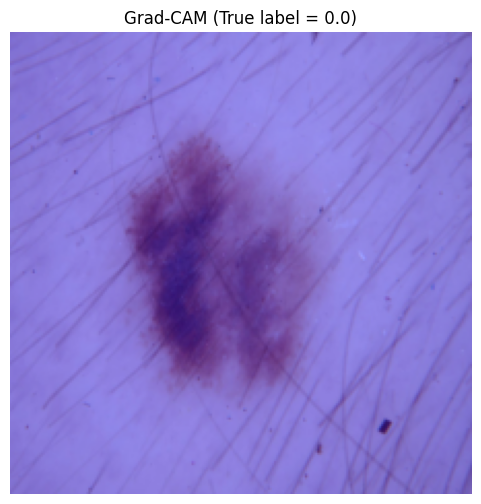

In [8]:
# ─── 1) Imports ─────────────────────────────────────────────────────────────────
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
from torchvision import transforms as T

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

# ─── 2) Ensure your model is on the right device ────────────────────────────────
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
model.eval()

# ─── 3) Pick & prepare one example image ────────────────────────────────────────
idx      = 0                           # index of the sample you want
row      = val_df.iloc[idx]
orig     = Image.open(row["img_path"]).convert("RGB")

# a) Tensor for model: [1,3,224,224]
img_t = val_transform(orig).unsqueeze(0).to(device)

# b) NumPy image for overlay: Resize + normalize to [0,1]
rgb_img = np.array(T.Resize((224,224))(orig)).astype(np.float32) / 255.0

# ─── 4) Instantiate GradCAM (no device arg) ────────────────────────────────────
cam = GradCAM(
    model=model,
    target_layers=[model.layer4[-1]],     # last conv layer of ResNet50
    reshape_transform=None                # default, okay for standard ResNet
)

# ─── 5) Generate the heatmap ───────────────────────────────────────────────────
grayscale_cam = cam(
    input_tensor=img_t,
    targets=[BinaryClassifierOutputTarget(1)]  # 1 = positive (melanoma)
)[0]  # get the single-image result

# ─── 6) Overlay & display ─────────────────────────────────────────────────────
vis = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

plt.figure(figsize=(6,6))
plt.imshow(vis)
plt.title(f"Grad-CAM (True label = {row['label']})")
plt.axis("off")
plt.show()


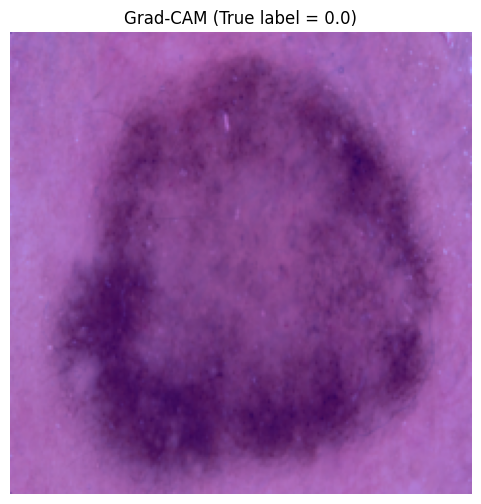

In [9]:
# ─── 1) Imports ─────────────────────────────────────────────────────────────────
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
from torchvision import transforms as T

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

# ─── 2) Ensure your model is on the right device ────────────────────────────────
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
model.eval()

# ─── 3) Pick & prepare one example image ────────────────────────────────────────
idx      = 1                           # index of the sample you want
row      = val_df.iloc[idx]
orig     = Image.open(row["img_path"]).convert("RGB")

# a) Tensor for model: [1,3,224,224]
img_t = val_transform(orig).unsqueeze(0).to(device)

# b) NumPy image for overlay: Resize + normalize to [0,1]
rgb_img = np.array(T.Resize((224,224))(orig)).astype(np.float32) / 255.0

# ─── 4) Instantiate GradCAM (no device arg) ────────────────────────────────────
cam = GradCAM(
    model=model,
    target_layers=[model.layer4[-1]],     # last conv layer of ResNet50
    reshape_transform=None                # default, okay for standard ResNet
)

# ─── 5) Generate the heatmap ───────────────────────────────────────────────────
grayscale_cam = cam(
    input_tensor=img_t,
    targets=[BinaryClassifierOutputTarget(1)]  # 1 = positive (melanoma)
)[0]  # get the single-image result

# ─── 6) Overlay & display ─────────────────────────────────────────────────────
vis = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

plt.figure(figsize=(6,6))
plt.imshow(vis)
plt.title(f"Grad-CAM (True label = {row['label']})")
plt.axis("off")
plt.show()


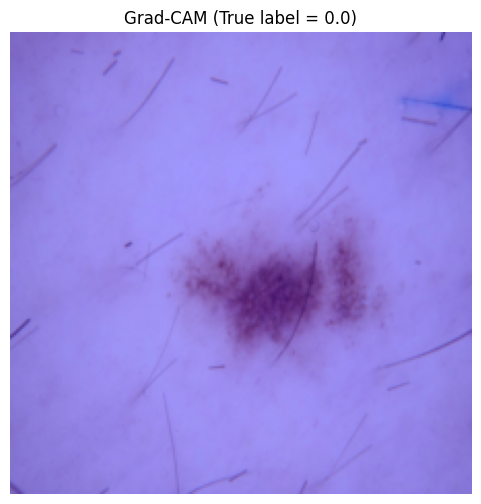

In [10]:
# ─── 1) Imports ─────────────────────────────────────────────────────────────────
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
from torchvision import transforms as T

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

# ─── 2) Ensure your model is on the right device ────────────────────────────────
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
model.eval()

# ─── 3) Pick & prepare one example image ────────────────────────────────────────
idx      = 2                           # index of the sample you want
row      = val_df.iloc[idx]
orig     = Image.open(row["img_path"]).convert("RGB")

# a) Tensor for model: [1,3,224,224]
img_t = val_transform(orig).unsqueeze(0).to(device)

# b) NumPy image for overlay: Resize + normalize to [0,1]
rgb_img = np.array(T.Resize((224,224))(orig)).astype(np.float32) / 255.0

# ─── 4) Instantiate GradCAM (no device arg) ────────────────────────────────────
cam = GradCAM(
    model=model,
    target_layers=[model.layer4[-1]],     # last conv layer of ResNet50
    reshape_transform=None                # default, okay for standard ResNet
)

# ─── 5) Generate the heatmap ───────────────────────────────────────────────────
grayscale_cam = cam(
    input_tensor=img_t,
    targets=[BinaryClassifierOutputTarget(1)]  # 1 = positive (melanoma)
)[0]  # get the single-image result

# ─── 6) Overlay & display ─────────────────────────────────────────────────────
vis = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

plt.figure(figsize=(6,6))
plt.imshow(vis)
plt.title(f"Grad-CAM (True label = {row['label']})")
plt.axis("off")
plt.show()


In [12]:
# ─── 0) (Re)compute true labels & predicted probabilities ───────────────────────
import torch
all_labels = []
all_probs  = []

model.eval()
with torch.no_grad():
    for images, labels in val_loader:
        images = images.to(device)
        labels = labels.to(device)

        logits = model(images)
        probs  = torch.sigmoid(logits).squeeze(1)

        all_probs.extend(probs.cpu().tolist())
        all_labels.extend(labels.cpu().tolist())

# Quick sanity check
print(f"Collected {len(all_probs)} probabilities and {len(all_labels)} labels.")


Collected 5067 probabilities and 5067 labels.


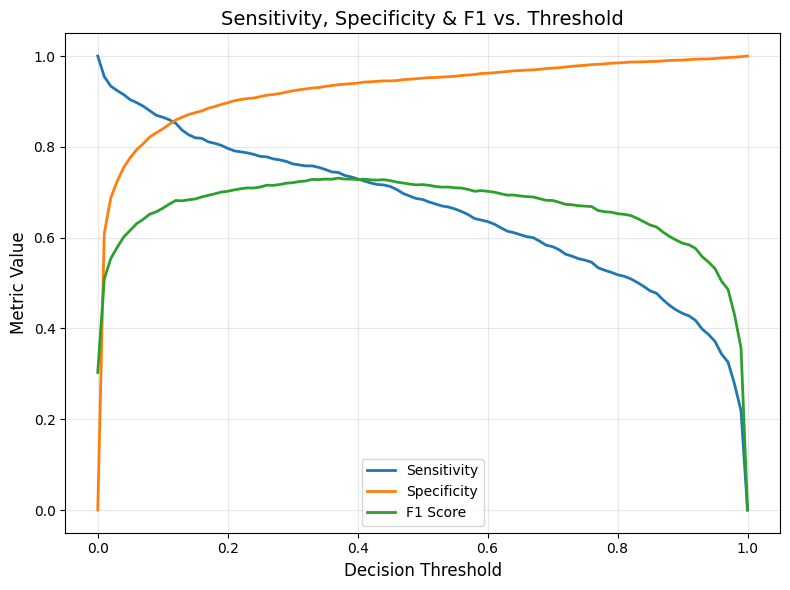

In [13]:
import numpy as np
import matplotlib.pyplot as plt

thresholds     = np.linspace(0.0, 1.0, 101)
sensitivities  = []
specificities  = []
f1_scores      = []

for thr in thresholds:
    preds = (np.array(all_probs) >= thr).astype(int)
    tp = ((preds == 1) & (np.array(all_labels) == 1)).sum()
    tn = ((preds == 0) & (np.array(all_labels) == 0)).sum()
    fp = ((preds == 1) & (np.array(all_labels) == 0)).sum()
    fn = ((preds == 0) & (np.array(all_labels) == 1)).sum()
    
    sens = tp / (tp + fn) if (tp + fn) > 0 else 0
    spec = tn / (tn + fp) if (tn + fp) > 0 else 0
    f1   = 2*tp / (2*tp + fp + fn) if (2*tp + fp + fn) > 0 else 0
    
    sensitivities.append(sens)
    specificities.append(spec)
    f1_scores.append(f1)

plt.figure(figsize=(8,6))
plt.plot(thresholds, sensitivities, label='Sensitivity', linewidth=2)
plt.plot(thresholds, specificities, label='Specificity', linewidth=2)
plt.plot(thresholds, f1_scores,     label='F1 Score',    linewidth=2)
plt.xlabel('Decision Threshold', fontsize=12)
plt.ylabel('Metric Value',         fontsize=12)
plt.title('Sensitivity, Specificity & F1 vs. Threshold', fontsize=14)
plt.legend(fontsize=10)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


In [14]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.isotonic import IsotonicRegression
from sklearn.calibration import calibration_curve, CalibrationDisplay
from sklearn.metrics import roc_auc_score


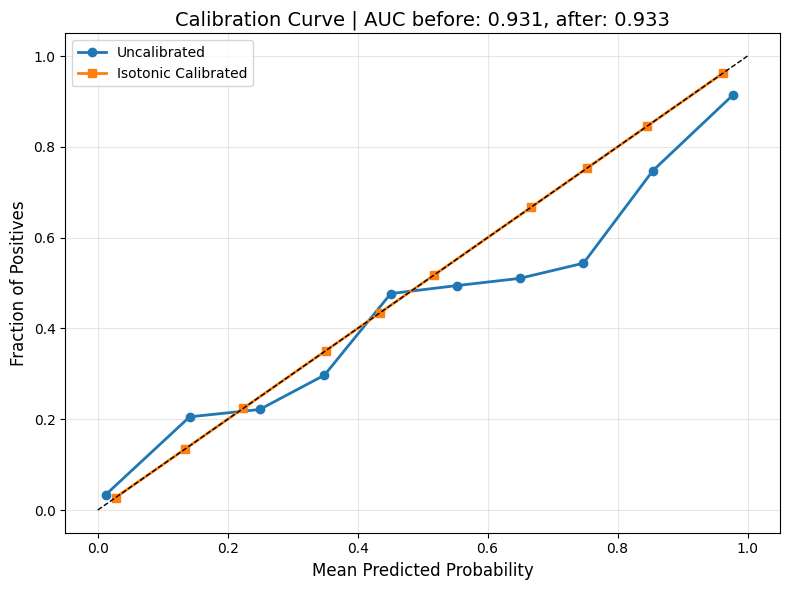

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.isotonic import IsotonicRegression
from sklearn.calibration import calibration_curve
from sklearn.metrics import roc_auc_score

# 1) Fit isotonic regression on your val set probs
iso_reg = IsotonicRegression(out_of_bounds='clip')
calibrated_probs = iso_reg.fit_transform(all_probs, all_labels)

# 2) Compute AUC before/after
auc_before = roc_auc_score(all_labels, all_probs)
auc_after  = roc_auc_score(all_labels, calibrated_probs)

# 3) Compute calibration curve points
prob_true_uc, prob_pred_uc = calibration_curve(all_labels, all_probs,       n_bins=10)
prob_true_c,  prob_pred_c  = calibration_curve(all_labels, calibrated_probs, n_bins=10)

# 4) Plot manually
plt.figure(figsize=(8,6))
plt.plot(prob_pred_uc, prob_true_uc, marker='o', linewidth=2, label='Uncalibrated')
plt.plot(prob_pred_c,  prob_true_c,  marker='s', linewidth=2, label='Isotonic Calibrated')

# Perfectly calibrated line
plt.plot([0,1], [0,1], 'k--', linewidth=1)

plt.title(f'Calibration Curve | AUC before: {auc_before:.3f}, after: {auc_after:.3f}', fontsize=14)
plt.xlabel('Mean Predicted Probability', fontsize=12)
plt.ylabel('Fraction of Positives',      fontsize=12)
plt.legend(fontsize=10)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


In [1]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image

# ─── Setup ──────────────────────────────────────────────────────────────────────
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
archive_dir = r"C:\Users\rimic\Desktop\Skin Lesion Images for Melanoma Classification\archive"
img_dir     = os.path.join(archive_dir, "ISIC_2019_Training_Input", "ISIC_2019_Training_Input")
gt_path     = os.path.join(archive_dir, "ISIC_2019_Training_GroundTruth.csv")
meta_path   = os.path.join(archive_dir, "ISIC_2019_Training_Metadata.csv")

# Load and merge metadata
gt_df   = pd.read_csv(gt_path)
meta_df = pd.read_csv(meta_path)
df      = pd.merge(gt_df, meta_df, on="image")
df["img_path"] = df["image"].apply(lambda x: os.path.join(img_dir, f"{x}.jpg"))
df["label"]    = df["MEL"]

# Transforms
train_transform = transforms.Compose([transforms.Resize((224,224)), transforms.RandomHorizontalFlip(),
                                      transforms.RandomRotation(15), transforms.ToTensor()])
val_transform   = transforms.Compose([transforms.Resize((224,224)), transforms.ToTensor()])

# Custom Dataset
class ISICDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform
    def __len__(self):
        return len(self.df)
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(row["img_path"]).convert("RGB")
        if self.transform: img = self.transform(img)
        return img, int(row["label"])

# Training & validation functions
def train_one_epoch(loader, model, criterion, optimizer):
    model.train()
    running_loss = 0.0
    for images, labels in loader:
        images, labels = images.to(device), labels.float().unsqueeze(1).to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
    return running_loss / len(loader.dataset)

@torch.no_grad()
def validate(loader, model, criterion):
    model.eval()
    running_loss = 0.0
    all_labels, all_probs = [], []
    for images, labels in loader:
        images, labels = images.to(device), labels.float().unsqueeze(1).to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)
        running_loss += loss.item() * images.size(0)
        probs = torch.sigmoid(outputs).cpu().numpy().ravel()
        all_probs.extend(probs)
        all_labels.extend(labels.cpu().numpy().ravel())
    auc = roc_auc_score(all_labels, all_probs)
    return running_loss / len(loader.dataset), auc, all_labels, all_probs

# ─── K-Fold Cross-Validation ────────────────────────────────────────────────────
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
fold_paths = []

for fold, (train_idx, val_idx) in enumerate(kf.split(df, df["label"])):
    print(f"\n=== Fold {fold+1} ===")
    train_df = df.loc[train_idx]
    val_df   = df.loc[val_idx]
    
    train_loader = DataLoader(ISICDataset(train_df, train_transform),
                              batch_size=32, shuffle=True,  num_workers=0)
    val_loader   = DataLoader(ISICDataset(val_df,   val_transform),
                              batch_size=32, shuffle=False, num_workers=0)
    
    # Model init
    model = models.resnet50(pretrained=True)
    model.fc = nn.Linear(model.fc.in_features, 1)
    model = model.to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)
    
    best_auc = 0.0
    # Train epochs
    for epoch in range(1, 6):  # e.g. 5 epochs per fold
        train_loss = train_one_epoch(train_loader, model, criterion, optimizer)
        val_loss, val_auc, _, _ = validate(val_loader, model, criterion)
        print(f"Epoch {epoch} — Train Loss: {train_loss:.4f}, Val AUC: {val_auc:.4f}")
        if val_auc > best_auc:
            best_auc = val_auc
            path = f"fold{fold+1}_best.pth"
            torch.save(model.state_dict(), path)
            fold_paths.append(path)
            print("  ↳ Saved", path)
    # clear memory
    del model, optimizer, criterion

# ─── Ensemble Inference on Full Validation Set ───────────────────────────────────
# Recombine all validation samples into a single loader (shuffle=False preserves order)
full_val_loader = DataLoader(ISICDataset(df, val_transform),
                             batch_size=32, shuffle=False, num_workers=0)

ensemble_probs = np.zeros(len(df))
for path in fold_paths:
    # reload model
    model = models.resnet50(pretrained=True)
    model.fc = nn.Linear(model.fc.in_features, 1)
    model.load_state_dict(torch.load(path, map_location=device))
    model = model.to(device).eval()

    # collect probs
    probs = []
    with torch.no_grad():
        for images, _ in full_val_loader:
            images = images.to(device)
            probs.extend(torch.sigmoid(model(images)).cpu().numpy().ravel())
    ensemble_probs += np.array(probs)

# average across folds
ensemble_probs /= len(fold_paths)

# Compute ensemble AUC
ensemble_auc = roc_auc_score(df["label"], ensemble_probs)
print(f"\nEnsembled AUC = {ensemble_auc:.4f}")



=== Fold 1 ===


C:\Users\rimic\anaconda3\envs\dl-tl\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\rimic\anaconda3\envs\dl-tl\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1 — Train Loss: 0.3501, Val AUC: 0.8688
  ↳ Saved fold1_best.pth
Epoch 2 — Train Loss: 0.3057, Val AUC: 0.8884
  ↳ Saved fold1_best.pth
Epoch 3 — Train Loss: 0.2781, Val AUC: 0.8945
  ↳ Saved fold1_best.pth
Epoch 4 — Train Loss: 0.2557, Val AUC: 0.8957
  ↳ Saved fold1_best.pth
Epoch 5 — Train Loss: 0.2301, Val AUC: 0.9062
  ↳ Saved fold1_best.pth

=== Fold 2 ===


C:\Users\rimic\anaconda3\envs\dl-tl\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\rimic\anaconda3\envs\dl-tl\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1 — Train Loss: 0.3505, Val AUC: 0.8572
  ↳ Saved fold2_best.pth
Epoch 2 — Train Loss: 0.3072, Val AUC: 0.8785
  ↳ Saved fold2_best.pth
Epoch 3 — Train Loss: 0.2811, Val AUC: 0.8985
  ↳ Saved fold2_best.pth
Epoch 4 — Train Loss: 0.2516, Val AUC: 0.8942
Epoch 5 — Train Loss: 0.2368, Val AUC: 0.8997
  ↳ Saved fold2_best.pth

=== Fold 3 ===


C:\Users\rimic\anaconda3\envs\dl-tl\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\rimic\anaconda3\envs\dl-tl\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1 — Train Loss: 0.3497, Val AUC: 0.8774
  ↳ Saved fold3_best.pth
Epoch 2 — Train Loss: 0.3060, Val AUC: 0.8783
  ↳ Saved fold3_best.pth
Epoch 3 — Train Loss: 0.2785, Val AUC: 0.8873
  ↳ Saved fold3_best.pth
Epoch 4 — Train Loss: 0.2537, Val AUC: 0.9030
  ↳ Saved fold3_best.pth
Epoch 5 — Train Loss: 0.2350, Val AUC: 0.9108
  ↳ Saved fold3_best.pth

=== Fold 4 ===


C:\Users\rimic\anaconda3\envs\dl-tl\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\rimic\anaconda3\envs\dl-tl\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1 — Train Loss: 0.3479, Val AUC: 0.8780
  ↳ Saved fold4_best.pth
Epoch 2 — Train Loss: 0.3011, Val AUC: 0.8766
Epoch 3 — Train Loss: 0.2809, Val AUC: 0.8883
  ↳ Saved fold4_best.pth
Epoch 4 — Train Loss: 0.2555, Val AUC: 0.9025
  ↳ Saved fold4_best.pth
Epoch 5 — Train Loss: 0.2316, Val AUC: 0.9152
  ↳ Saved fold4_best.pth

=== Fold 5 ===


C:\Users\rimic\anaconda3\envs\dl-tl\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\rimic\anaconda3\envs\dl-tl\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1 — Train Loss: 0.3484, Val AUC: 0.8601
  ↳ Saved fold5_best.pth
Epoch 2 — Train Loss: 0.3060, Val AUC: 0.8824
  ↳ Saved fold5_best.pth
Epoch 3 — Train Loss: 0.2809, Val AUC: 0.8752
Epoch 4 — Train Loss: 0.2582, Val AUC: 0.8979
  ↳ Saved fold5_best.pth
Epoch 5 — Train Loss: 0.2324, Val AUC: 0.9077
  ↳ Saved fold5_best.pth


C:\Users\rimic\anaconda3\envs\dl-tl\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\rimic\anaconda3\envs\dl-tl\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)



Ensembled AUC = 0.9770


Total false positives: 258
Total false negatives: 1204


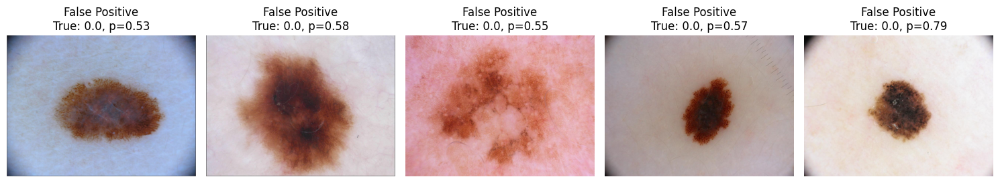

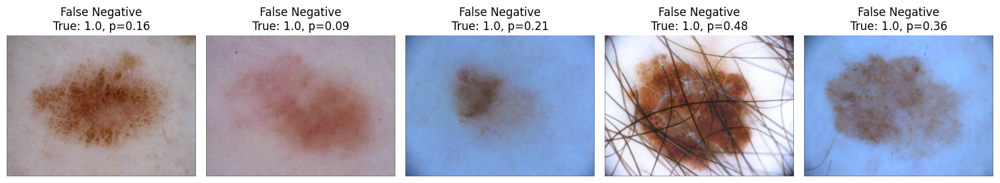

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# 1) Choose your operating threshold
threshold = 0.5

# 2) Compute binary predictions from your ensemble probabilities
preds  = (ensemble_probs >= threshold).astype(int)
labels = df["label"].values

# 3) Find FP and FN indices
fp_idx = np.where((preds == 1) & (labels == 0))[0]
fn_idx = np.where((preds == 0) & (labels == 1))[0]

print(f"Total false positives: {len(fp_idx)}")
print(f"Total false negatives: {len(fn_idx)}")

# 4) Helper to display a grid of error cases
def show_errors(idxs, title, n=5):
    plt.figure(figsize=(n*3, 3))
    for i, idx in enumerate(idxs[:n]):
        img = Image.open(df.iloc[idx]["img_path"]).convert("RGB")
        prob = ensemble_probs[idx]
        true = labels[idx]
        ax = plt.subplot(1, n, i+1)
        ax.imshow(img)
        ax.set_title(f"{title}\nTrue: {true}, p={prob:.2f}")
        ax.axis("off")
    plt.tight_layout()
    plt.show()

# 5) Display the first few FPs and FNs
show_errors(fp_idx, "False Positive")
show_errors(fn_idx, "False Negative")


Best threshold (max F1): 0.35 → F1 = 0.8422



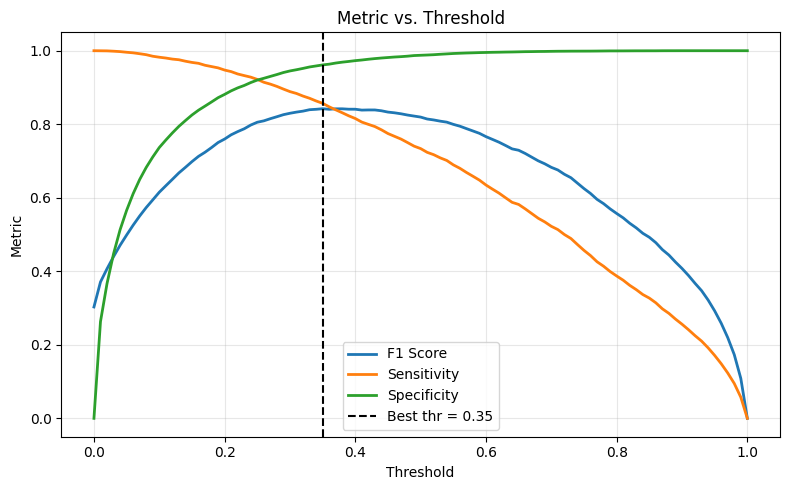

Classification Report at threshold = 0.35000000000000003
              precision    recall  f1-score   support

         0.0     0.9687    0.9613    0.9650     20809
         1.0     0.8280    0.8569    0.8422      4522

    accuracy                         0.9427     25331
   macro avg     0.8983    0.9091    0.9036     25331
weighted avg     0.9436    0.9427    0.9431     25331

Confusion Matrix:
 [[20004   805]
 [  647  3875]]


In [3]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    f1_score, precision_score, recall_score,
    confusion_matrix, classification_report
)

# 1) Sweep thresholds and record metrics
thresholds = np.linspace(0.0, 1.0, 101)
f1s        = []
sens       = []
spec       = []

for thr in thresholds:
    preds = (ensemble_probs >= thr).astype(int)
    f1s.append(f1_score(labels,     preds))
    sens.append(recall_score(labels, preds))  # sensitivity
    tn, fp, fn, tp = confusion_matrix(labels, preds).ravel()
    spec.append(tn / (tn + fp))               # specificity

# 2) Find the threshold that maximizes F1
best_idx = np.argmax(f1s)
best_thr = thresholds[best_idx]
print(f"Best threshold (max F1): {best_thr:.2f} → F1 = {f1s[best_idx]:.4f}\n")

# 3) Plot F1, sensitivity & specificity vs. threshold
plt.figure(figsize=(8,5))
plt.plot(thresholds, f1s,  label="F1 Score",      linewidth=2)
plt.plot(thresholds, sens, label="Sensitivity",   linewidth=2)
plt.plot(thresholds, spec, label="Specificity",   linewidth=2)
plt.axvline(best_thr, color="k", linestyle="--", label=f"Best thr = {best_thr:.2f}")
plt.xlabel("Threshold")
plt.ylabel("Metric")
plt.title("Metric vs. Threshold")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# 4) Compute & display final metrics at best_thr
final_preds = (ensemble_probs >= best_thr).astype(int)
print("Classification Report at threshold =", best_thr)
print(classification_report(labels, final_preds, digits=4))

cm = confusion_matrix(labels, final_preds)
print("Confusion Matrix:\n", cm)


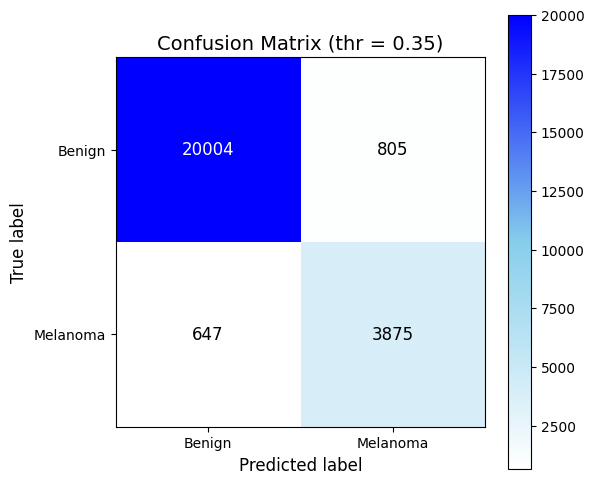

In [6]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
from sklearn.metrics import confusion_matrix

# Assuming 'labels', 'final_preds', and 'best_thr' are defined in your environment
cm = confusion_matrix(labels, final_preds)

# Create a custom colormap: white -> skyblue -> blue
colors = ["white", "skyblue", "blue"]
cmap = LinearSegmentedColormap.from_list("white_sky_blue", colors)

# Plot
fig, ax = plt.subplots(figsize=(6, 6))
im = ax.imshow(cm, interpolation="nearest", cmap=cmap)
ax.set_title(f"Confusion Matrix (thr = {best_thr:.2f})", fontsize=14)
ax.set_xlabel("Predicted label", fontsize=12)
ax.set_ylabel("True label", fontsize=12)
ax.set_xticks([0, 1])
ax.set_yticks([0, 1])
ax.set_xticklabels(["Benign", "Melanoma"], fontsize=10)
ax.set_yticklabels(["Benign", "Melanoma"], fontsize=10)

# Colorbar
cbar = ax.figure.colorbar(im, ax=ax, shrink=0.8)
cbar.ax.tick_params(labelsize=10)

# Annotate counts
thresh = cm.max() / 2.0
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(
            j, i, f"{cm[i, j]}",
            ha="center", va="center",
            color="black" if cm[i, j] < thresh else "white",
            fontsize=12
        )

plt.tight_layout()
plt.show()


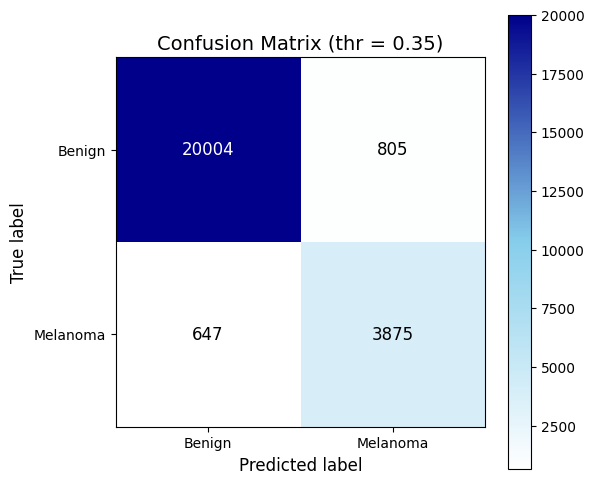

In [7]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
from sklearn.metrics import confusion_matrix

# ─── Assumptions ────────────────────────────────────────────────────────────────
# 'labels'       : array of true 0/1 labels
# 'final_preds'  : array of predicted 0/1 labels at your chosen 'best_thr'
# 'best_thr'     : the threshold value you selected

# 1) Compute the confusion matrix
cm = confusion_matrix(labels, final_preds)

# 2) Create a custom colormap: white → skyblue → dark blue
colors = ["white", "skyblue", "darkblue"]
cmap = LinearSegmentedColormap.from_list("white_sky_darkblue", colors)

# 3) Plot
fig, ax = plt.subplots(figsize=(6,6))
im = ax.imshow(cm, interpolation="nearest", cmap=cmap)
ax.set_title(f"Confusion Matrix (thr = {best_thr:.2f})", fontsize=14)
ax.set_xlabel("Predicted label", fontsize=12)
ax.set_ylabel("True label", fontsize=12)
ax.set_xticks([0,1])
ax.set_yticks([0,1])
ax.set_xticklabels(["Benign", "Melanoma"], fontsize=10)
ax.set_yticklabels(["Benign", "Melanoma"], fontsize=10)

# 4) Add colorbar
cbar = ax.figure.colorbar(im, ax=ax, shrink=0.8)
cbar.ax.tick_params(labelsize=10)

# 5) Annotate counts with contrast-aware text color
thresh = cm.max() / 2.0
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(
            j, i, f"{cm[i, j]}",
            ha="center", va="center",
            color="black" if cm[i, j] < thresh else "white",
            fontsize=12
        )

plt.tight_layout()
plt.show()


C:\Users\rimic\anaconda3\envs\dl-tl\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\rimic\anaconda3\envs\dl-tl\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


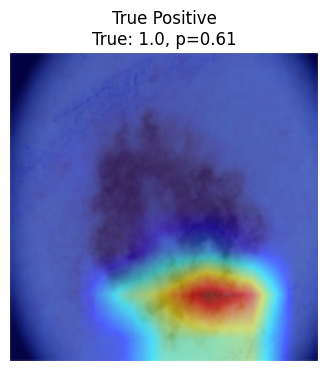

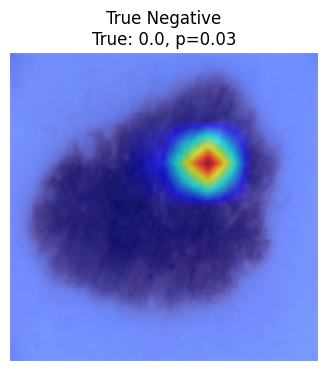

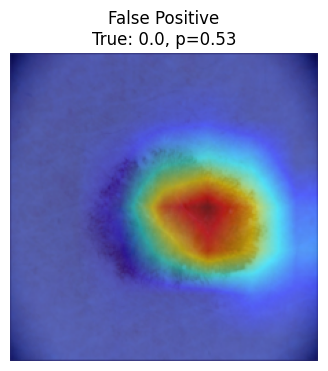

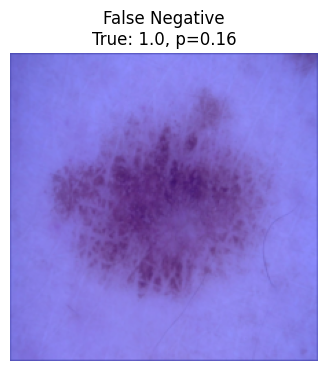

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
from torchvision import transforms, models
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

# ─── CPU-only setup ─────────────────────────────────────────────────────────────
device = torch.device("cpu")
best_thr = best_thr  # your chosen threshold
model_path = "fold3_best.pth"   # replace with your best model file

# Load the model onto CPU
model = models.resnet50(pretrained=True)
model.fc = torch.nn.Linear(model.fc.in_features, 1)
model.load_state_dict(torch.load(model_path, map_location="cpu"))
model.to(device).eval()

# Identify categories from your ensemble output
ensemble_preds = (ensemble_probs >= best_thr).astype(int)
labels_arr     = np.array(df["label"])

idx_categories = {
    "True Positive":  np.where((ensemble_preds==1)&(labels_arr==1))[0],
    "True Negative":  np.where((ensemble_preds==0)&(labels_arr==0))[0],
    "False Positive": np.where((ensemble_preds==1)&(labels_arr==0))[0],
    "False Negative": np.where((ensemble_preds==0)&(labels_arr==1))[0],
}

# Prepare GradCAM (CPU)
cam = GradCAM(model=model, target_layers=[model.layer4[-1]])

# Helper to show one CAM overlay
def show_cam(idx, title):
    img = Image.open(df.iloc[idx]["img_path"]).convert("RGB")
    img_t = val_transform(img).unsqueeze(0).to(device)
    rgb_img = np.array(transforms.Resize((224,224))(img), dtype=np.float32) / 255.0

    gray_cam = cam(input_tensor=img_t, targets=[BinaryClassifierOutputTarget(1)])[0]
    overlay  = show_cam_on_image(rgb_img, gray_cam, use_rgb=True)

    plt.figure(figsize=(4,4))
    plt.imshow(overlay)
    prob = ensemble_probs[idx]
    true = labels_arr[idx]
    plt.title(f"{title}\nTrue: {true}, p={prob:.2f}")
    plt.axis("off")
    plt.show()

# Display one example per category
for name, inds in idx_categories.items():
    if len(inds):
        show_cam(inds[0], name)
    else:
        print(f"No examples for {name}")


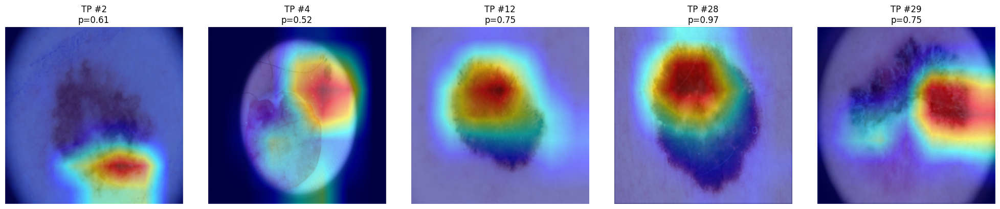

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget

# 1) Find all True-Positive indices
tp_idx = np.where((ensemble_probs >= best_thr) & (labels_arr == 1))[0]

# 2) Choose how many to show (e.g. first 5)
n_show = min(5, len(tp_idx))
selected = tp_idx[:n_show]

# 3) Plot them side-by-side
fig, axes = plt.subplots(1, n_show, figsize=(4*n_show, 4))
for ax, idx in zip(axes, selected):
    # Load & preprocess
    img = Image.open(df.iloc[idx]["img_path"]).convert("RGB")
    img_t = val_transform(img).unsqueeze(0).to(device)
    # Prepare numpy image for overlay
    rgb_img = np.array(img.resize((224,224))).astype(np.float32) / 255.0

    # Generate CAM
    grayscale_cam = cam(input_tensor=img_t, 
                        targets=[BinaryClassifierOutputTarget(1)])[0]
    overlay = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

    # Display
    ax.imshow(overlay)
    ax.set_title(f"TP #{idx}\np={ensemble_probs[idx]:.2f}")
    ax.axis("off")

plt.tight_layout()
plt.show()


In [11]:
import os

# 1) Point this at the folder you actually want to run inference on:
test_folder = r"C:\Users\rimic\Desktop\Skin Lesion Images for Melanoma Classification\test_images"

# 2) Check existence
print("Exists?", os.path.exists(test_folder))
if not os.path.exists(test_folder):
    # List everything in the parent directory so you can pick the right folder name
    parent = os.path.dirname(test_folder)
    print("Contents of parent folder:", os.listdir(parent))
else:
    # 3) List image files
    files = [f for f in os.listdir(test_folder)
             if f.lower().endswith((".jpg",".jpeg",".png"))]
    print(f"Found {len(files)} image(s):", files[:10])


Exists? False
Contents of parent folder: ['archive', 'archive.zip', 'Here.docx', 'Papers']


In [12]:
# Use your ISIC training‐input folder as a demo
test_folder = os.path.join(
    r"C:\Users\rimic\Desktop\Skin Lesion Images for Melanoma Classification\archive",
    "ISIC_2019_Training_Input",
    "ISIC_2019_Training_Input"
)

# Verify it exists and list a few files
print("Exists?", os.path.exists(test_folder))
files = [f for f in os.listdir(test_folder) if f.lower().endswith((".jpg",".jpeg",".png"))]
print(f"Found {len(files)} images, e.g.:", files[:5])

# Now run batch inference on that folder
df_results = infer_folder("melanoma_resnet50_scripted.pt", test_folder)
print(df_results.head())


Exists? True
Found 25331 images, e.g.: ['ISIC_0000000.jpg', 'ISIC_0000001.jpg', 'ISIC_0000002.jpg', 'ISIC_0000003.jpg', 'ISIC_0000004.jpg']
           filename  melanoma_prob
0  ISIC_0000000.jpg       0.021422
1  ISIC_0000001.jpg       0.024394
2  ISIC_0000002.jpg       0.288441
3  ISIC_0000003.jpg       0.006261
4  ISIC_0000004.jpg       0.710836
